In [2]:
import pymc3 as pm
import theano
import numpy as np

Setting number of obs and number of groups

In [1]:
n_obs = 100
n_groups = 10

Create *non-linear* data

In [3]:
X = np.random.randn(n_obs, 1).reshape(n_obs, 1)
mu_sim = np.sin(X) ** 2


Create varying intercepts

In [4]:
groups = np.random.randint(0, n_groups - 1, 100)
alpha_vals = np.random.normal(0, 1, n_groups)
alpha = alpha_vals[ groups]
alpha = alpha.reshape(n_obs, 1)


In [5]:
y_sigma = 1

y = np.random.normal(mu_sim + alpha, y_sigma).reshape(100, )


Using BART

In [7]:
coords = {"group_id": np.arange(n_groups), "obs_id": np.arange(n_obs)}
with pm.Model(coords=coords) as bart_model:
    σ = pm.HalfNormal('σ', sigma = 1)
    group_idx = pm.Data("group_idx", groups, dims = 'obs_id')
    α_μ = pm.Normal('α_μ', 0, 1)
    α_σ = pm.HalfNormal('α_σ', sigma = 1)
    α = pm.Normal('α', α_μ, α_σ, dims = 'group_id')
    α_group = α[group_idx]
    μ = pm.BART('μ', X, y, m=100)
    y_star = pm.Normal('y_star', μ + α_group, σ, observed=y)



In [8]:
with bart_model:
    trace = pm.sample(cores = 2,  nuts={'target_accept':0.99} )



The BART model is experimental. Use with caution.
Multiprocess sampling (2 chains in 2 jobs)
CompoundStep
>NUTS: [α, α_σ, α_μ, σ]
>PGBART: [μ]


In [9]:
output = pm.summary(trace)

In [10]:
output.sort_values('r_hat')

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
α_μ,-0.028,0.298,-0.625,0.531,0.009,0.006,1156.0,1156.0,1166.0,1197.0,1.00
μ[24],0.304,0.607,-0.679,1.498,0.040,0.032,235.0,185.0,278.0,163.0,1.00
μ[33],0.203,0.293,-0.317,0.789,0.017,0.012,283.0,281.0,290.0,314.0,1.00
μ[34],-0.112,0.343,-0.708,0.436,0.021,0.016,269.0,230.0,279.0,265.0,1.00
μ[37],1.476,0.594,0.411,2.516,0.035,0.025,292.0,283.0,299.0,359.0,1.00
...,...,...,...,...,...,...,...,...,...,...,...
μ[18],0.520,0.295,-0.008,1.091,0.020,0.014,213.0,213.0,214.0,283.0,1.02
μ[25],0.542,0.396,-0.176,1.335,0.024,0.018,267.0,246.0,274.0,294.0,1.03
μ[31],-0.414,0.335,-0.976,0.161,0.021,0.015,243.0,243.0,266.0,374.0,1.03
μ[53],0.569,0.321,-0.027,1.162,0.022,0.016,211.0,208.0,211.0,320.0,1.03


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fd6f8359f90>,
      dtype=object)

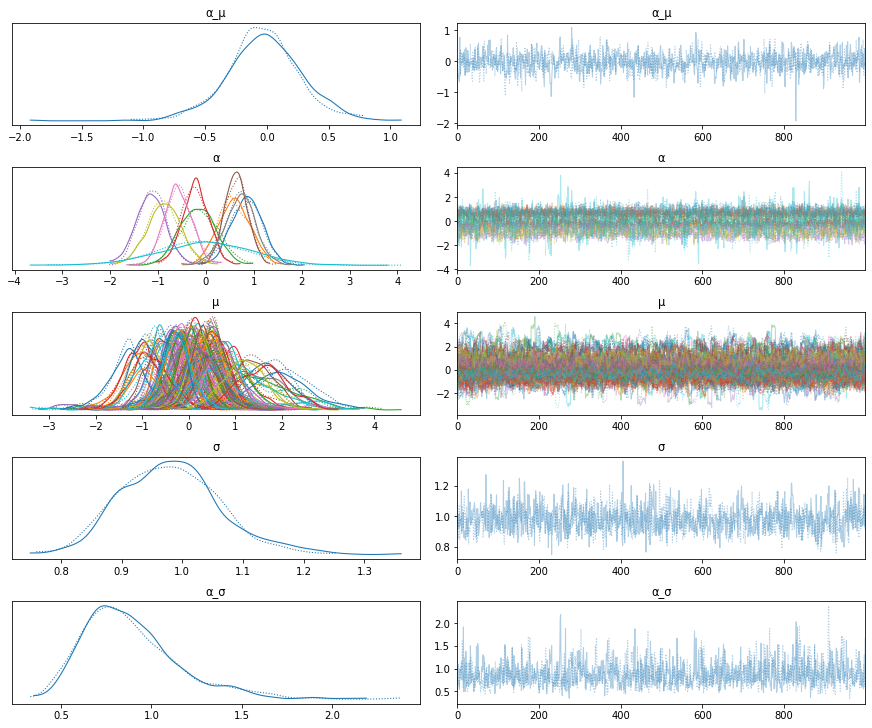

In [11]:
pm.traceplot(trace)

In [12]:
bart_model_pp = pm.sample_posterior_predictive(trace, model=bart_model)

mean_pred = bart_model_pp['y_star'].mean(axis= 0)

In [13]:
# Baseline Variance
np.var(y)

2.1171686732837536

In [14]:
# MSE
np.mean((y - mean_pred)**2)


0.6944614260507409

In [15]:
import seaborn as sns

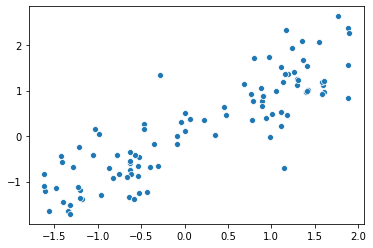

In [16]:
sns.scatterplot(x = (mu_sim + alpha).reshape(n_obs, ), y = mean_pred)